<a href="https://colab.research.google.com/github/BannedMatt/SSL26/blob/main/TP_CLIP_matthew_banawa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TP : apprentissage multimodal


Dans ce TP, nous allons utiliser le modèle d'apprentissage, FashionCLIP, pré-entraîné sur des images ainsi que des descriptions en langage naturel. Plus particulièrement, nous allons considérer deux cas d'usage :

*   **Moteur de recherche d'images :** il s'agit de trouver, à partir d'une requête en langage naturel, l'image correspondante.

*   **Classification zero-shot :** il s'agit simplement de construire un classifieur d'images (faire correspondre un label à une image).



## Dataset

Nous allons dans un premier temps télécharger les données. Celles-ci provienennt de [Kaggle](https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations).

In [1]:
%%capture
!pip install gdown
!gdown "1igAuIEW_4h_51BG1o05WS0Q0-Cp17_-t&confirm=t"
!unzip data

### Modèle FashionCLIP

Nous allons également télécharger le modèle pré-entraîné.

In [2]:
%%capture
!pip install -U fashion-clip

In [3]:
import sys
#sys.path.append("fashion-clip/")
from fashion_clip.fashion_clip import FashionCLIP
import pandas as pd
import numpy as np
from collections import Counter
from PIL import Image
import numpy as np
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import *
from sklearn.linear_model import LogisticRegression
from IPython.display import display

In [4]:
%%capture
fclip = FashionCLIP('fashion-clip')

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


FashionCLIP, à l'instar de CLIP, crée un espace vectoriel partagé pour les images et le texte. Cela permet de nombreuses applications, telles que la recherche (trouver l'image la plus similaire à une requête donnée) ou la classification zero-shot.

Il y a principalement deux composants : un encodeur d'image (pour générer un vecteur à partir d'une image) et un encodeur de texte (pour générer un vecteur à partir d'un texte).










<img src="https://miro.medium.com/v2/resize:fit:1400/0*FLNMtW6jK51fm7Og"  width="400">



Nous allons télécharger les données que nous allons ensuite nettoyer.

In [5]:
articles = pd.read_csv("data_for_fashion_clip/articles.csv")

# Supprimer les éléments ayant la même description
subset = articles.drop_duplicates("detail_desc").copy()

# upprimer les images dont la catégrie n'est pas renseignée
subset = subset[~subset["product_group_name"].isin(["Unknown"])]

# Garder seulement les descriptions dont la longueur est inférieure à 40 tokens
subset = subset[subset["detail_desc"].apply(lambda x : 4 < len(str(x).split()) < 40)]

# Supprimer les articles qui ne sont pas suffisamment fréquents dans le jeu de données
most_frequent_product_types = [k for k, v in dict(Counter(subset["product_type_name"].tolist())).items() if v > 10]
subset = subset[subset["product_type_name"].isin(most_frequent_product_types)]

subset.head(3)

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,108775044,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
1,176754003,176754,2 Row Braided Headband (1),74,Hair/alice band,Accessories,1010016,Solid,17,Yellowish Brown,...,Hair Accessories,C,Ladies Accessories,1,Ladieswear,66,Womens Small accessories,1019,Accessories,Two-strand hairband with braids in imitation s...
3,189634031,189634,Long Leg Leggings,273,Leggings/Tights,Garment Lower body,1010016,Solid,93,Dark Green,...,Basic 1,D,Divided,2,Divided,51,Divided Basics,1002,Jersey Basic,Leggings in stretch jersey with an elasticated...


In [6]:
subset.to_csv("subset_data.csv", index=False)
f"Il y a {len(subset)} éléments dans le dataset"

'Il y a 3104 éléments dans le dataset'

## Moteur de recherche d'images

Constuire un moteur de recherche qui permet, à partir d'une description en langage naturel, de récupérer l'image correspondante. Mesurer ses performances (précision).

<img src="https://miro.medium.com/v2/resize:fit:1400/1*cnKHgLAumVyuHuK9pkqr7A.gif"  width="800">


In [14]:
images = ["data_for_fashion_clip/" + str(k) + ".jpg" for k in subset["article_id"].tolist()]
texts = subset["detail_desc"].tolist()

# Créer les représentations vectorielles (embeddings) des images et des descriptions.
image_embeddings = fclip.encode_images(images, batch_size=32)
image_embeddings = image_embeddings / np.linalg.norm(image_embeddings, ord=2, axis=1, keepdims=True)
text_embeddings = fclip.encode_text(texts, batch_size=32)
text_embeddings = text_embeddings / np.linalg.norm(text_embeddings, ord=2, axis=1, keepdims=True)

100%|██████████| 97/97 [03:09<00:00,  1.96s/it]


Map:   0%|          | 0/3104 [00:00<?, ? examples/s]

100%|██████████| 97/97 [00:05<00:00, 16.24it/s]


In [15]:
print(image_embeddings.shape)
print(text_embeddings.shape)

(3104, 512)
(3104, 512)


In [36]:
def search_engine(prompt):
  text_embedding = fclip.encode_text([prompt], 32)[0]

  id_of_matched_object = np.argmax(text_embedding.dot(image_embeddings.T))
  found_object = subset["article_id"].iloc[id_of_matched_object].tolist()

  image = Image.open(f"data_for_fashion_clip/{found_object}.jpg")
  return image

Map:   0%|          | 0/1 [00:00<?, ? examples/s]

1it [00:00, 16.36it/s]


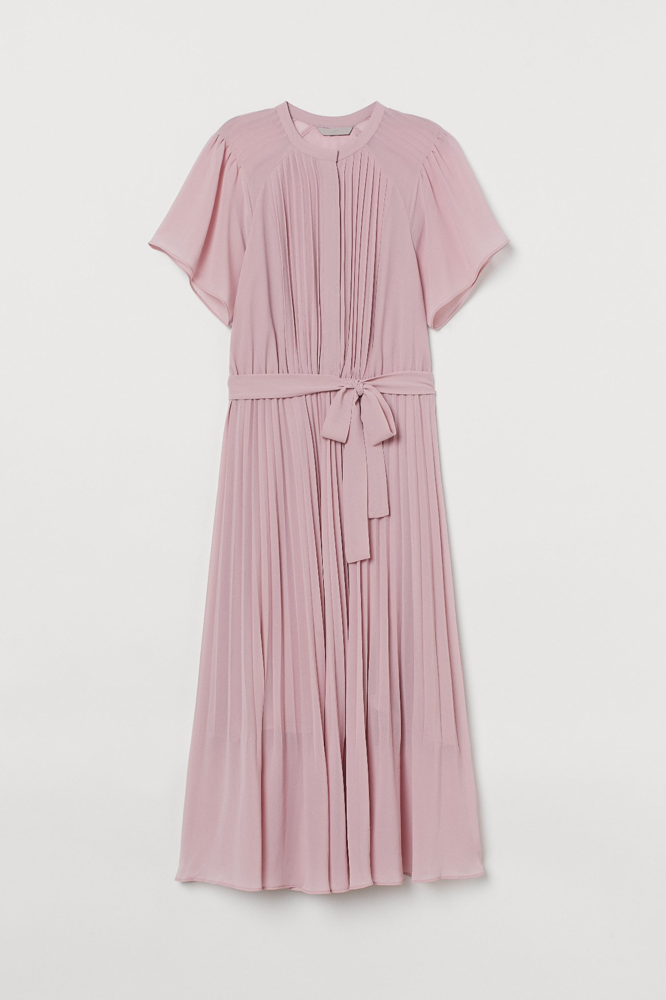

In [37]:
search_engine("a pink dress")

Notre moteur de recherche semble bien fonctionner.

# Classification zero-shot

Construite un classsifieur d'images (prédire le label d'une image). Mesurer ses performances.

<img src="https://miro.medium.com/v2/resize:fit:1400/1*No6ZONpQMIcfFaNMOI5oNw.gif"  width="800">



On utilisera les types de produit comme labels.

In [21]:
labels = subset["product_type_name"].unique()
labels

array(['Vest top', 'Hair/alice band', 'Leggings/Tights', 'T-shirt',
       'Sneakers', 'Sunglasses', 'Cardigan', 'Gloves', 'Underwear Tights',
       'Hoodie', 'Other shoe', 'Shorts', 'Jumpsuit/Playsuit', 'Dress',
       'Trousers', 'Belt', 'Socks', 'Underwear bottom', 'Bodysuit',
       'Hat/beanie', 'Scarf', 'Jacket', 'Other accessories', 'Bra',
       'Swimwear bottom', 'Blazer', 'Top', 'Polo shirt', 'Sweater',
       'Necklace', 'Pyjama set', 'Blouse', 'Bag', 'Shirt', 'Coat',
       'Boots', 'Skirt', 'Garment Set', 'Bikini top', 'Sandals',
       'Dungarees', 'Earring', 'Cap/peaked', 'Ballerinas', 'Swimsuit',
       'Hat/brim'], dtype=object)

Ci-dessous une démonstration du classifier.

In [22]:
labels_prompt = [f"a photo of a {k}" for k in labels]

label_embeddings = fclip.encode_text(labels_prompt, batch_size=32)
label_embeddings = label_embeddings/np.linalg.norm(label_embeddings, ord=2, axis=-1, keepdims=True)

Map:   0%|          | 0/46 [00:00<?, ? examples/s]

2it [00:00, 11.79it/s]                       


In [23]:
predicted_classes_distribution = label_embeddings.dot(image_embeddings.T)
predicted = [labels[k] for k in np.argmax(predicted_classes_distribution, axis=0)]

In [24]:
print(classification_report(subset["product_type_name"], predicted))

                   precision    recall  f1-score   support

              Bag       0.97      0.85      0.91        40
       Ballerinas       0.67      0.15      0.25        13
             Belt       0.75      0.92      0.83        13
       Bikini top       0.68      0.73      0.70        37
           Blazer       0.94      0.87      0.90        38
           Blouse       0.47      0.79      0.59       135
         Bodysuit       0.53      0.64      0.58        25
            Boots       0.91      0.65      0.75        31
              Bra       0.90      0.77      0.83        60
       Cap/peaked       0.95      0.86      0.90        21
         Cardigan       0.58      0.86      0.69        49
             Coat       0.18      0.92      0.30        12
            Dress       0.92      0.76      0.83       293
        Dungarees       0.32      0.67      0.43        12
          Earring       0.98      0.84      0.90        55
      Garment Set       0.71      0.18      0.29       

# Image to Image Search Engine

In [38]:
pink_dress = search_engine("a pink dress")

Map:   0%|          | 0/1 [00:00<?, ? examples/s]

1it [00:00, 19.57it/s]


1it [00:00,  4.27it/s]


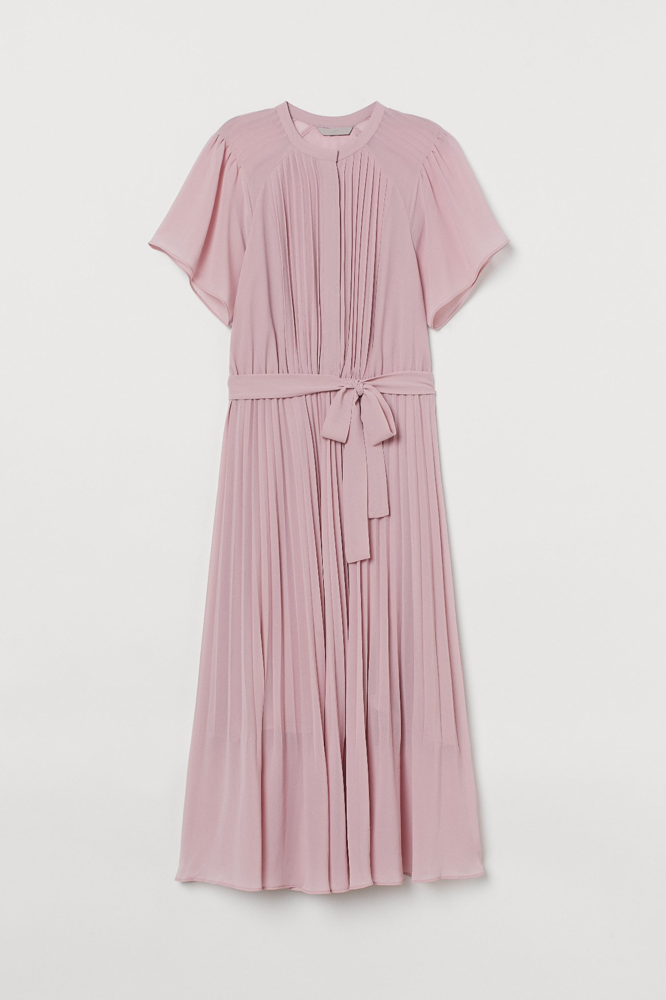

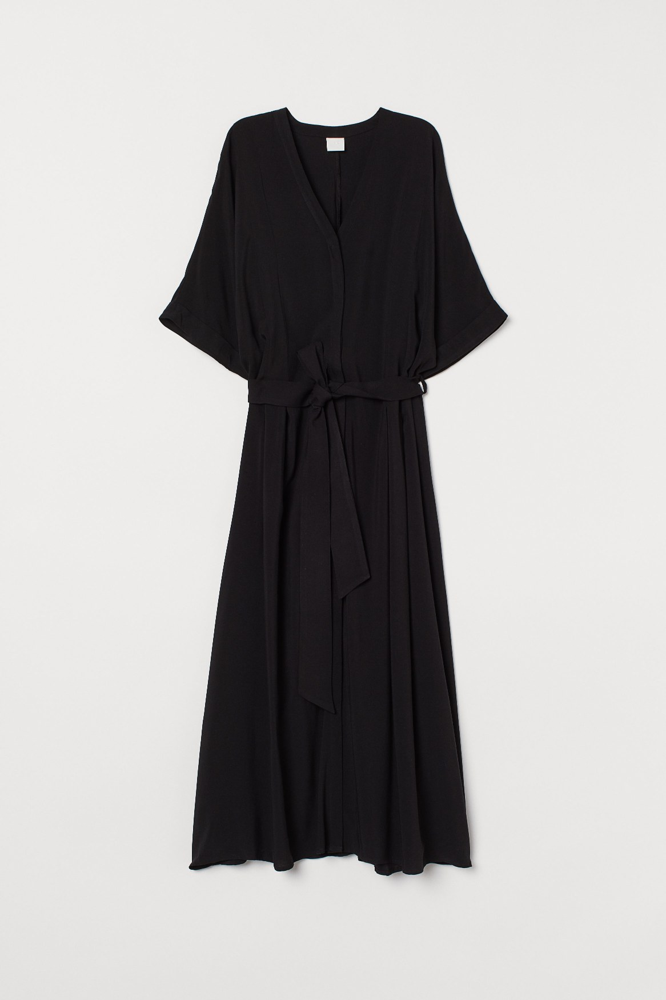

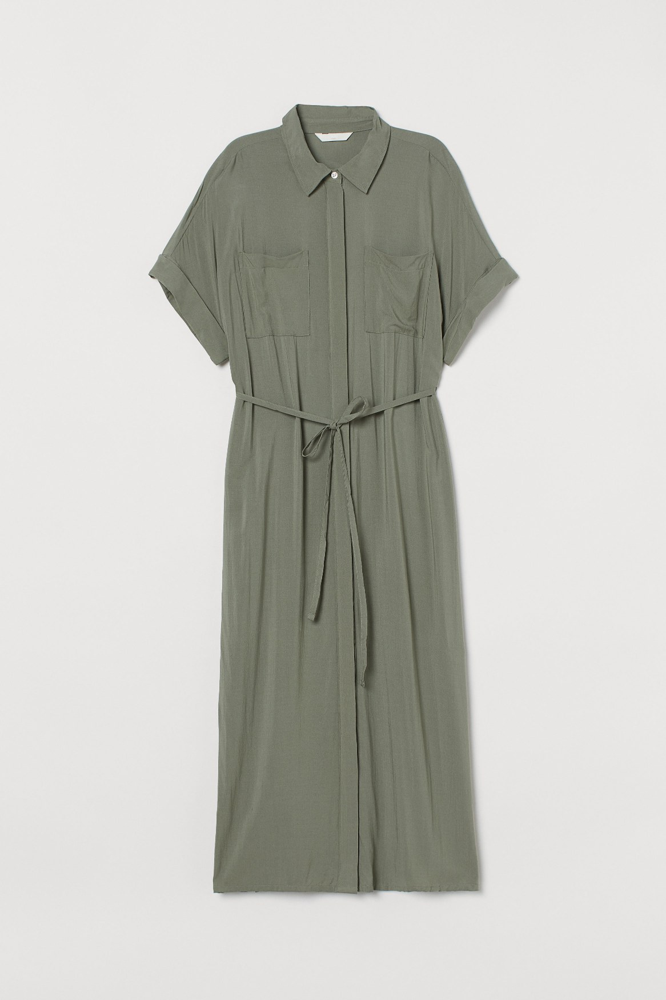

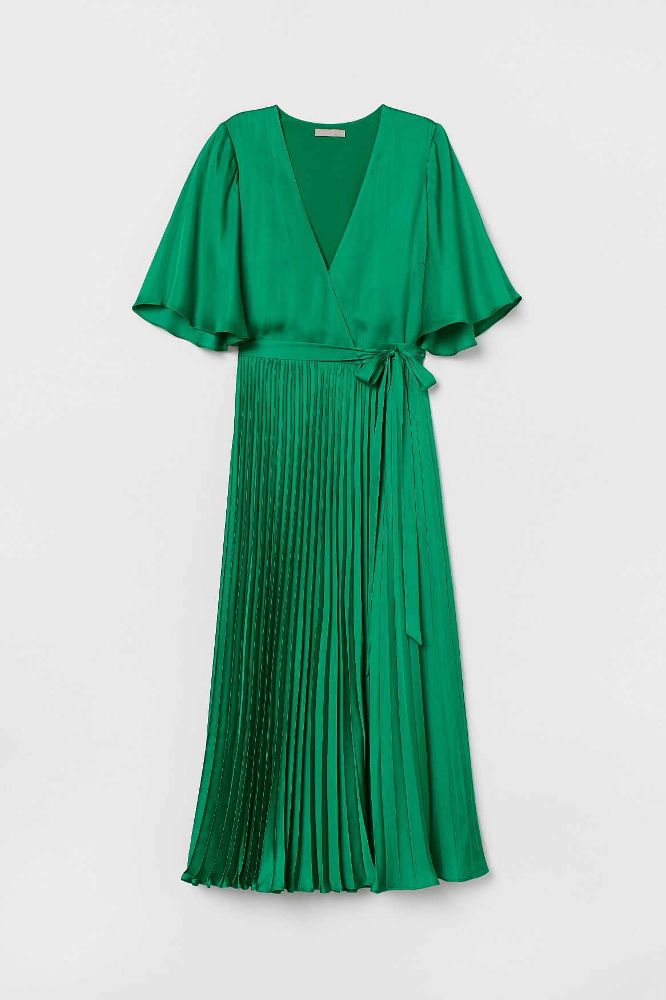

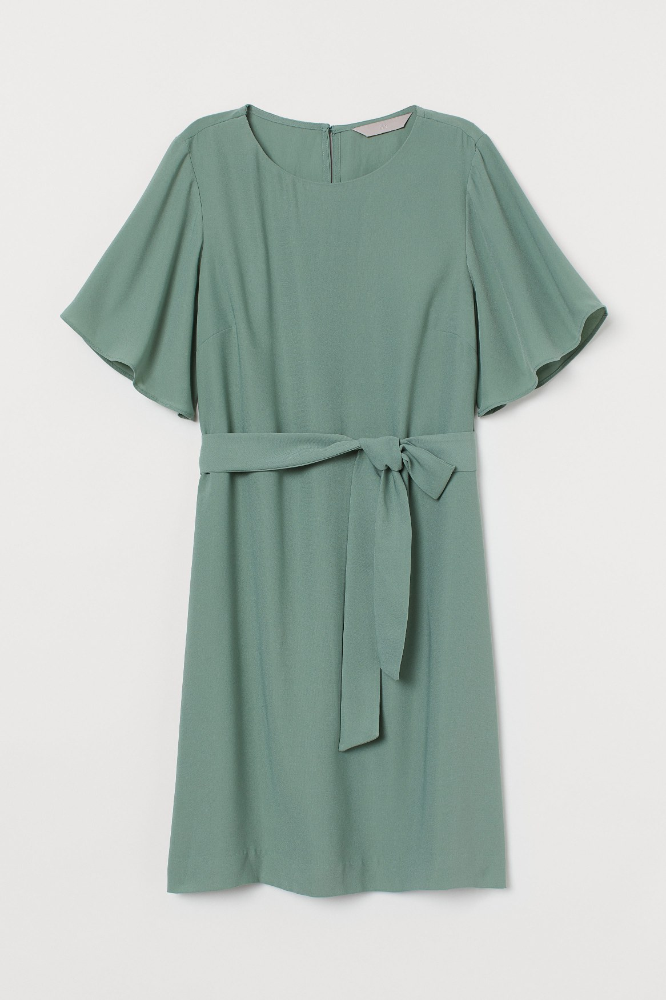

In [51]:
def I2I_search_engine(image, top_n=5):
  image_emb = fclip.encode_images([image], 32)[0]
  image_emb = image_emb/np.linalg.norm(image_emb, ord=2, axis=-1, keepdims=True)
  similarities = image_emb.dot(image_embeddings.T)
  top_n_indices = np.argsort(similarities)[::-1]
  found_article_ids = subset["article_id"].iloc[top_n_indices].tolist()
  images = [Image.open(f"data_for_fashion_clip/{aid}.jpg") for aid in found_article_ids]
  return images


similar_images = I2I_search_engine(pink_dress)
for i in range(len(top_5_similar_images)):
  display(similar_images[-1-i])

seems to me like if we dont specify a color like in the prompt search, the similarity of the embedding of images are most heavily affected by the shape of the clothing itself.

# Image Clustering


In [46]:
print(f"{image_embeddings.shape[1]}")
print(f"{text_embeddings.shape[1]}")

512
512


In [59]:
from sklearn.cluster import KMeans

In [60]:
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
image_cluster_labels = kmeans.fit_predict(image_embeddings)
print(f"completed with {n_clusters} clusters.")

completed with 10 clusters.


cluster 0:


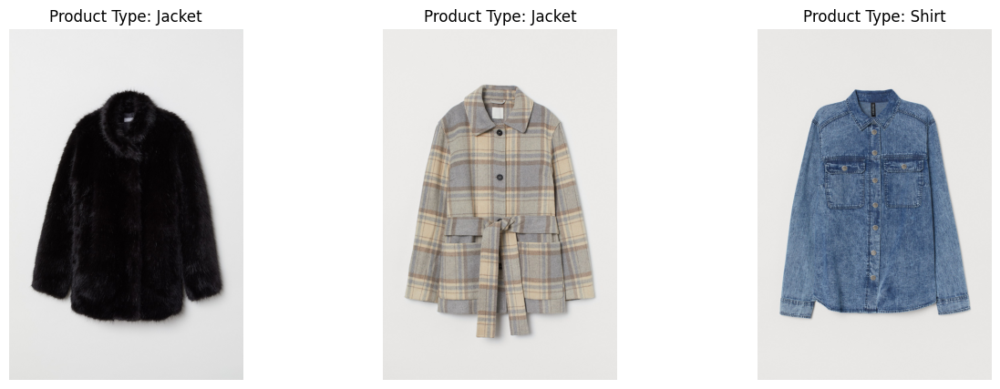

cluster 1:


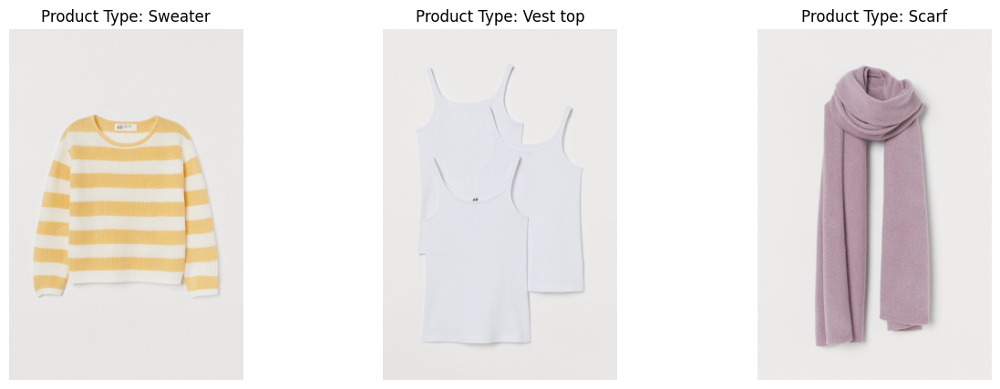

cluster 2:


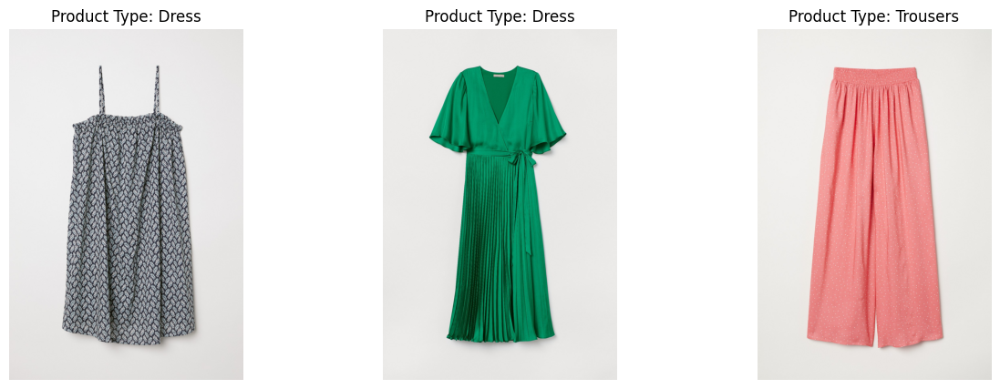

cluster 3:


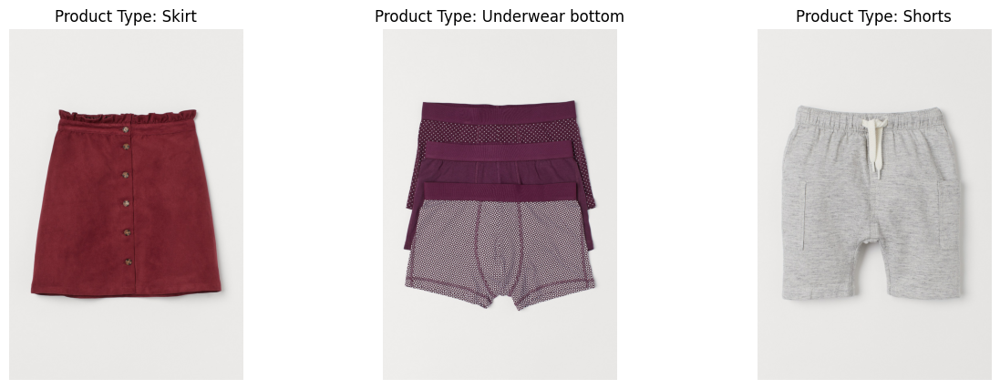

cluster 4:


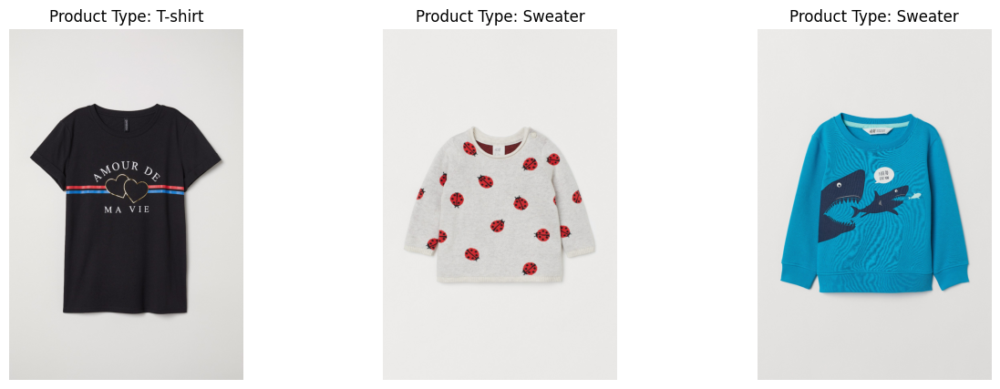

cluster 5:


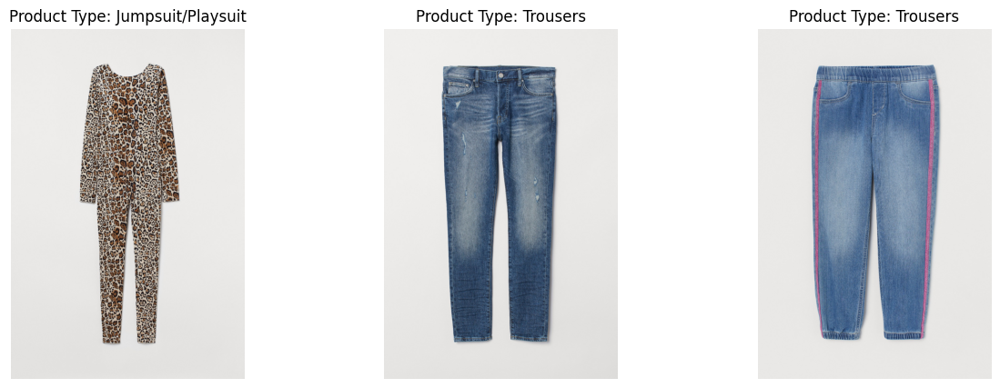

cluster 6:


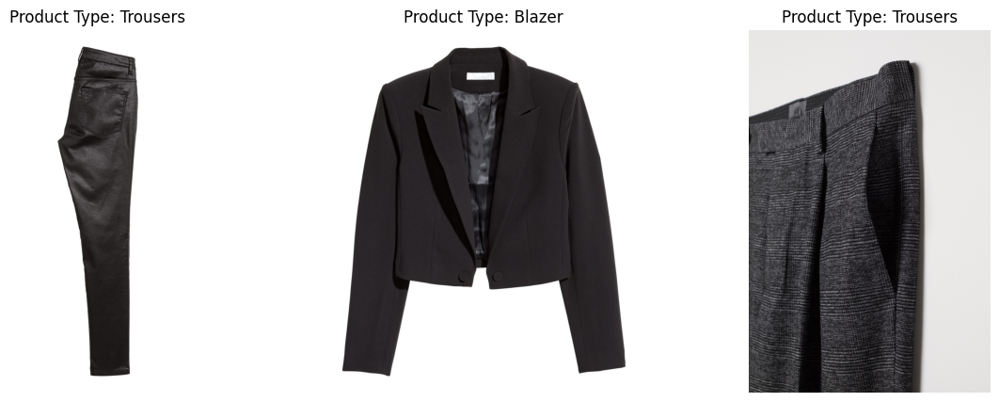

cluster 7:


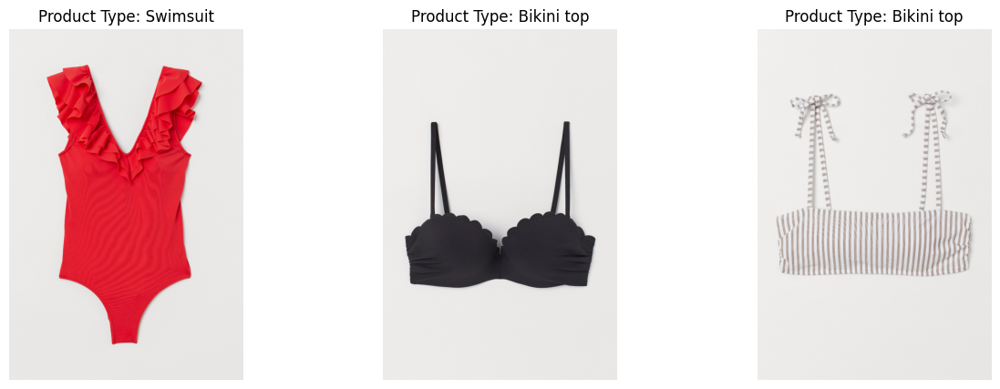

cluster 8:


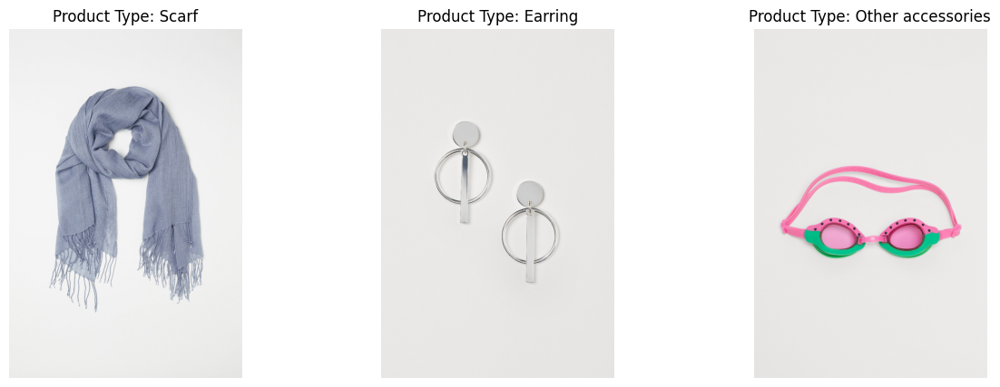

cluster 9:


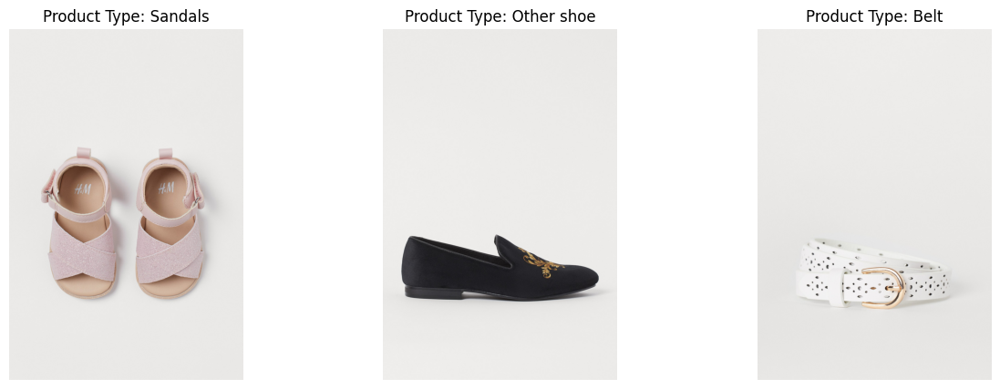

In [63]:
import matplotlib.pyplot as plt
import random

for i in range(n_clusters):
    print(f"cluster {i}:")
    cluster_indices = np.where(image_cluster_labels == i)[0]
    sample_indices = random.sample(list(cluster_indices), min(3, len(cluster_indices)))

    plt.figure(figsize=(15, 5))
    for j, idx in enumerate(sample_indices):
        article_id = subset["article_id"].iloc[idx]
        image_path = f"data_for_fashion_clip/{article_id}.jpg"
        image = Image.open(image_path)

        plt.subplot(1, min(5, len(sample_indices)), j + 1)
        plt.imshow(image)
        plt.title(f"Product Type: {subset['product_type_name'].iloc[idx]}")
        plt.axis('off')
    plt.show()
